In [3]:
%pip install numpy
%pip install opencv-python
%pip install matplotlib
%pip install scipy
%pip install numba

Note: you may need to restart the kernel to use updated packages.

Note: you may need to restart the kernel to use updated packages.




In [4]:
import math
import cv2 
import glob
import numpy as np
import matplotlib.pyplot as plt
from numba import njit,prange
from scipy.fft._pocketfft.basic import fft2, ifft2
from scipy.signal import gaussian
from scipy.signal.signaltools import wiener


In [5]:

def psnr(im1, im2):
	mse = np.mean((im1-im2)**2)
	if mse==0:
		return 100
	return 20*np.log10(1/np.sqrt(mse))
@njit
def Level_A(arr,i,j,ker,ker_max):
	k=ker//2
	kernel = arr[i-k:i+k+1,j-k:j+k+1]
	Zmin = np.min(kernel)
	Zmed = np.median(kernel)
	Zmax = np.max(kernel)

	A1 = Zmed - Zmin
	A2 = Zmed - Zmax

	if A1 > 0 and A2 < 0:
		return Level_B(kernel, Zmin, Zmed, Zmax)
	else:
		ker+= 2 
		if ker <= ker_max:
			return Level_A(arr,i,j,ker,ker_max)
		else:
			return Zmed

@njit
def Level_B(kernel, Zmin, Zmed, Zmax):
	row,col = kernel.shape
	Zxy = kernel[row//2,col//2]
	B1 = Zxy - Zmin
	B2 = Zxy - Zmax
	if B1 > 0 and B2 < 0 :
		return Zxy
	else:
		return Zmed

def noisy(noise_typ,image):
	if noise_typ == "gauss":
		var = 0.01
		std = math.sqrt(var)	
		gauss=np.random.normal(0,std,np.shape(image))		
		noisy=image+gauss
			
		return noisy	
	elif noise_typ == "s&p":
		s_vs_p = 0.5
		amount = 0.02
		out = np.copy(image)
		# Salt mode
		num_salt = np.ceil(amount*image.size*s_vs_p)
		coords = [np.random.randint(0,i-1,int(num_salt)) for i in image.shape]
		out[tuple(coords)] = 1
		
		# Pepper mode
		num_pepper = np.ceil(amount*image.size*(1-s_vs_p))
		coords = [np.random.randint(0,i-1,int(num_pepper)) for i in image.shape]
		out[tuple(coords)] = 0	
		return out

	elif noise_typ =="speckle":
		var = 0.01
		std = var**0.5	
		gauss = np.random.normal(0,std,np.shape(image))     
		noisy = image+image*gauss
		return noisy

	elif noise_typ == "poisson":
		vals = len(np.unique(image))
		vals = 2**np.ceil(np.log2(vals))
		noisy = np.random.poisson(image*vals)/float(vals)
			
		return noisy

def filter(filter_typ,imgN):
	if filter_typ == "mean":
		# Mean Filter
		row,col=imgN.shape
		res1=np.copy(imgN)
		ker=3
		k=ker//2
		arr=np.pad(imgN, k, mode='constant')
		for i in range(k,row+k):
			for j in range(k,col+k):		
				ker_mat = arr[i-k:i+k+1,j-k:j+k+1].flatten().tolist()
				t = np.sum(ker_mat)        
				res1[i-k,j-k] = t/len(ker_mat)
		return res1

	elif filter_typ == "median":
		# Median Filter
		row,col=imgN.shape
		res1=np.copy(imgN)
		ker=3
		k=ker//2
		arr=np.pad(imgN, k, mode='constant')
		for i in range(k,row+k):
			for j in range(k,col+k):
				ker_matrix = arr[i-k:i+k+1,j-k:j+k+1].flatten().tolist()
				temp=sorted(ker_matrix)		         
				res1[i-k,j-k] = np.median(temp)
		return res1
	elif filter_typ == "gaussian":
		sigma=1
		row,col=imgN.shape
		res1=np.copy(imgN)
		ker=5
		k=ker//2
		arr=np.pad(imgN, k, mode='constant')
		ker_mat=np.zeros((ker,ker))
		for i in range(-k,k+1):
			for j in range(-k,k+1):		         
				ker_mat[i+k,j+k] = np.exp(-((i)**2+(j)**2)/(2*sigma**2))/math.sqrt((2*math.pi*(sigma**2)))
		ker_mat=ker_mat/np.sum(ker_mat)
		
		for i in range(k,row+k):
			for j in range(k,col+k):
				temp=arr[i-k:i+k+1,j-k:j+k+1].flatten()*(ker_mat.flatten())
				res1[i-k,j-k] = np.sum(temp)		
		
		return res1	
	elif filter_typ == "bilateral":
		sigma=1
		sigmaI=1
		row,col=imgN.shape
		res1=np.copy(imgN)
		ker=7
		k=ker//2
		arr=np.pad(imgN, k, mode='constant')
		ker_mat=np.zeros((ker,ker))
		for i in range(0,ker):
			for j in range(0,ker):	
				x=math.sqrt(abs(i-k)**2 + abs(j-k)**2)	         
				ker_mat[i,j] = np.exp(-(x**2)/(2*sigma**2))/math.sqrt((2*math.pi*(sigma**2)))	
		for i in range(k,row+k):
			for j in range(k,col+k):
				imgq=arr[i-k:i+k+1,j-k:j+k+1]
				imgI=arr[i,j]-arr[i-k:i+k+1,j-k:j+k+1]
				imgIG= np.exp(-(imgI**2)/(2*sigmaI**2))/math.sqrt((2*math.pi*(sigmaI**2)))
				weights = np.multiply(ker_mat, imgIG)
				res1[i-k,j-k]=np.sum(np.multiply(imgq, weights))/ np.sum(weights)	
		imgN = imgN.astype(np.float32)	
					
		return res1	
		
	elif filter_typ == "wiener":
		ker=3
		sigma=ker/3
		h = gaussian(ker, sigma).reshape(ker, 1)
		h = np.dot(h, h.transpose())
		h /= np.sum(h)
		nsr=0.1
		Hk = fft2(h,s=imgN.shape)
		kernel = np.conj(Hk)/(np.abs(Hk)**2+nsr)
		dummy = fft2(imgN)*kernel
		res1 = np.abs(ifft2(dummy))
		res1=wiener(imgN,ker,nsr)
		return res1

	elif filter_typ =="adaptiveLocal":
		row,col=imgN.shape
		res1=np.copy(imgN)
		ker=5
		k=ker//2		
		varNoi=0
		varLoc=np.copy(imgN)
		arr=np.pad(imgN, k, mode='constant')					
		for i in range(k,row+k):
			for j in range(k,col+k):
				ker_mat = arr[i-k:i+k+1,j-k:j+k+1].flatten().tolist()
				varLoc[i-k,j-k]=np.var(ker_mat)
				meanLoc=np.mean(ker_mat)	
				varNoi=varNoi+varLoc[i-k,j-k]/(row*col)	         
				res1[i-k,j-k] = (imgN[i-k,j-k]-meanLoc)	
		varLoc=np.maximum(varLoc,varNoi)
		res1 = imgN-(varNoi/varLoc)*res1			
		return res1

	elif filter_typ == "adaptiveMedian":
		# Adaptive Median Filter
		row,col = imgN.shape
		res1=np.copy(imgN)
		ker_max=7
		k_max = ker_max//2
		arr=np.pad(imgN, k_max, mode='constant')
		ker=3
		for i in prange(k_max,k_max+row):
			for j in range(k_max,k_max+col):
				res1[i-k_max,j-k_max] = Level_A(arr,i,j,ker,ker_max)
		return res1

def showImg(imgO,x,y,i):
	plt.figure(figsize=(8,8))
	if imgO.ndim==2:
		imgN=noisy(x[i],imgO)
		plt.subplot(1,2,1)
		plt.imshow(imgO,cmap='gray')
		plt.title('Original')
		
		txt="psnr="+str(psnr(imgN,imgO))
		plt.subplot(1,2,2)
		plt.imshow(imgN,cmap='gray')
		plt.title('%s noise'%x[i])
		plt.xlabel(txt)
		print("The signal to noise ratio of image with",x[i],"noise is" ,psnr(imgN,imgO))
		plt.figure(figsize=(14,14))
		for j in range(len(y)):
			res=filter(y[j],imgN)
			txt="psnr="+str(psnr(res,imgO))
			plt.subplot(3,4,j+1)
			plt.imshow(res,cmap='gray')
			plt.title('%s'%y[j])
				
			plt.xlabel(txt)
			print("The signal to noise ratio of denoised image using",y[j],"filter is",psnr(res,imgO))
	if imgO.ndim==3:
		res=np.copy(imgO)
		row,col,ch=imgO.shape
		imgN=noisy(x[i],imgO)
		plt.subplot(1,2,1)
		plt.imshow(imgO)
		plt.title('Original')
		
		txt="psnr="+str(psnr(imgN,imgO))
		plt.subplot(1,2,2)
		plt.imshow(imgN)
		plt.title('%s noise'%x[i])
		plt.xlabel(txt)
		print("The signal to noise ratio of image with",x[i],"noise is",psnr(imgN,imgO))
		plt.figure(figsize=(14,14))
		for j in range(len(y)):
			for i in range(ch):	
				res[:,:,i]=filter(y[j],imgN[:,:,i])
			txt="psnr="+str(psnr(res,imgO))
			plt.subplot(3,4,j+1)
			plt.imshow(res)
			plt.title('%s'%y[j])
				
			plt.xlabel(txt)
			print("The signal to noise ratio of denoised image using",y[j],"filter is",psnr(res,imgO))
	plt.show()
	return

In [6]:
imgOr=plt.imread('test.png')
imgOr=cv2.cvtColor(imgOr, cv2.COLOR_BGR2GRAY)
blur=cv2.blur(imgOr,(7,7))

imgOr = cv2.normalize(imgOr, None, alpha = 0, beta = 1, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
imgOr = imgOr.astype(np.float32)

x=['s&p','gauss','speckle','poisson']
y=['mean','median','gaussian','bilateral','wiener','adaptiveLocal','adaptiveMedian']


The signal to noise ratio of image with s&p noise is 21.034544901078817
The signal to noise ratio of denoised image using mean filter is 24.618890382174833
The signal to noise ratio of denoised image using median filter is 28.848085858972855
The signal to noise ratio of denoised image using gaussian filter is 24.715708823329404
The signal to noise ratio of denoised image using bilateral filter is 25.423165086087508
The signal to noise ratio of denoised image using wiener filter is 25.287076231900045
The signal to noise ratio of denoised image using adaptiveLocal filter is 23.748643505204946
The signal to noise ratio of denoised image using adaptiveMedian filter is 31.936544783418377


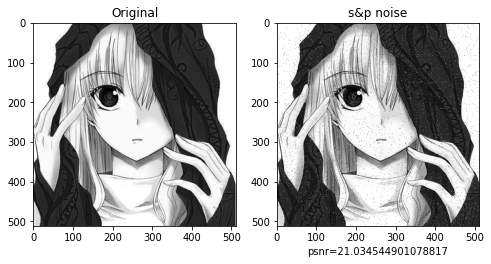

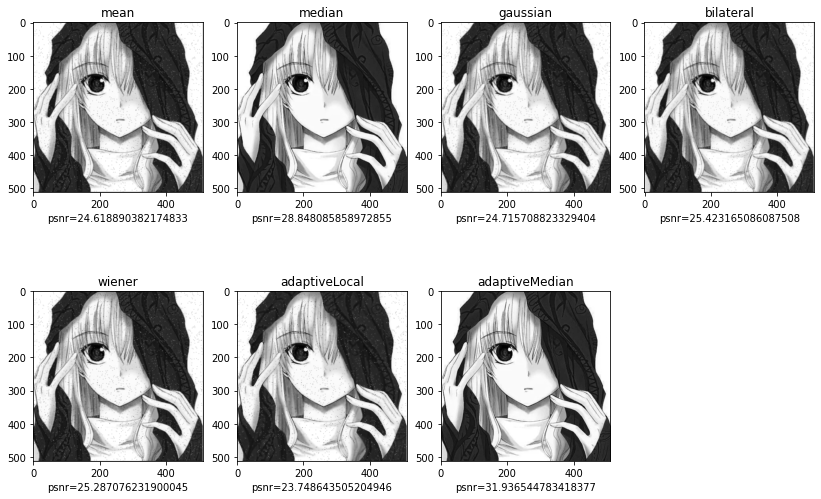

In [7]:
showImg(imgOr,x,y,0)

The signal to noise ratio of image with gauss noise is 19.986209593579183
The signal to noise ratio of denoised image using mean filter is 24.525175123666546
The signal to noise ratio of denoised image using median filter is 24.764262380290543
The signal to noise ratio of denoised image using gaussian filter is 24.717744747187893
The signal to noise ratio of denoised image using bilateral filter is 25.352607483780446
The signal to noise ratio of denoised image using wiener filter is 25.227003358631155
The signal to noise ratio of denoised image using adaptiveLocal filter is 25.85395460487341
The signal to noise ratio of denoised image using adaptiveMedian filter is 22.414152226644685


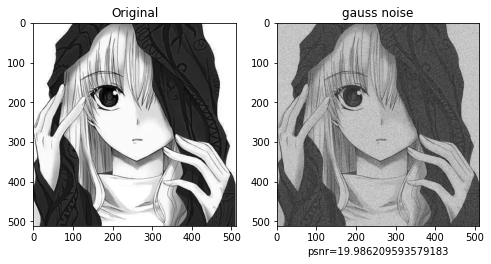

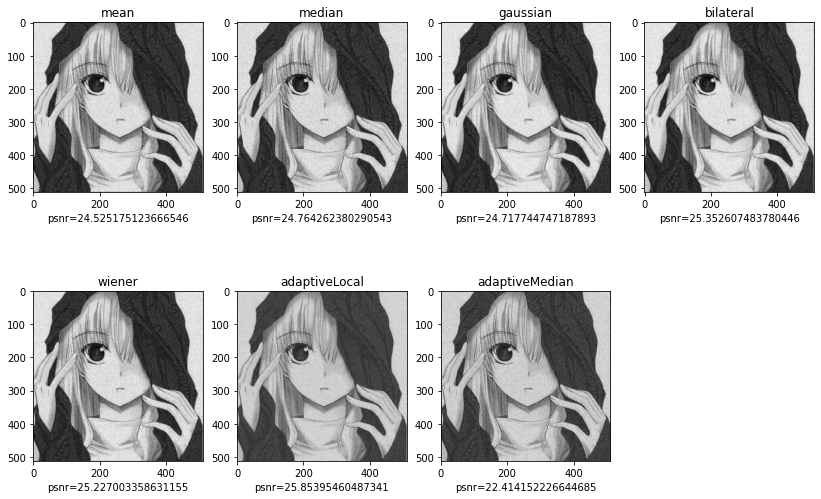

In [8]:
showImg(imgOr,x,y,1)


The signal to noise ratio of image with speckle noise is 23.23162572319451
The signal to noise ratio of denoised image using mean filter is 25.307512249444905
The signal to noise ratio of denoised image using median filter is 26.43086563628918
The signal to noise ratio of denoised image using gaussian filter is 25.305193074321988
The signal to noise ratio of denoised image using bilateral filter is 26.015931456468145
The signal to noise ratio of denoised image using wiener filter is 26.154374538216278
The signal to noise ratio of denoised image using adaptiveLocal filter is 27.174900057582107
The signal to noise ratio of denoised image using adaptiveMedian filter is 25.277283598158093


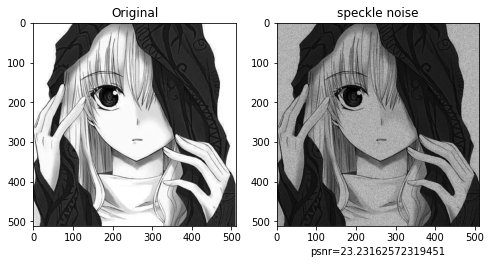

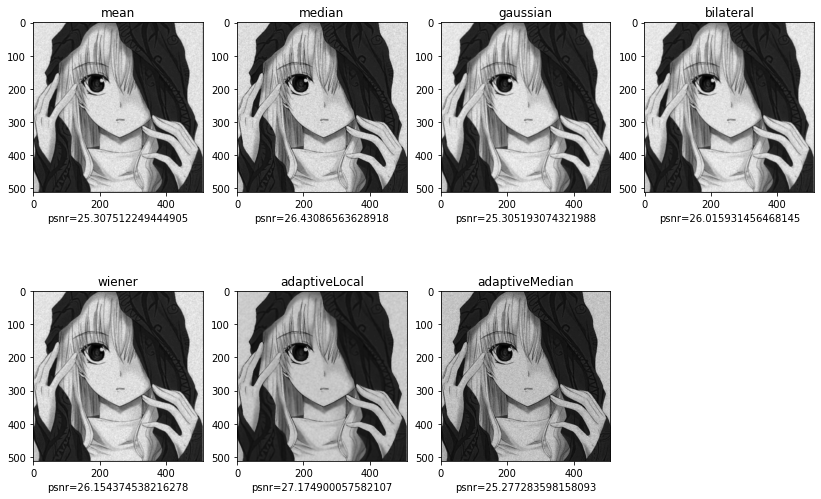

In [9]:
showImg(imgOr,x,y,2)


The signal to noise ratio of image with poisson noise is 53.552799442438456
The signal to noise ratio of denoised image using mean filter is 26.137943599309345
The signal to noise ratio of denoised image using median filter is 29.154854968325804
The signal to noise ratio of denoised image using gaussian filter is 25.904604891165533
The signal to noise ratio of denoised image using bilateral filter is 26.715905319969217
The signal to noise ratio of denoised image using wiener filter is 27.212386808161263
The signal to noise ratio of denoised image using adaptiveLocal filter is 29.403748214728314
The signal to noise ratio of denoised image using adaptiveMedian filter is 34.21556659958703


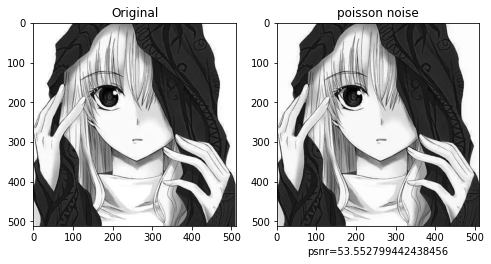

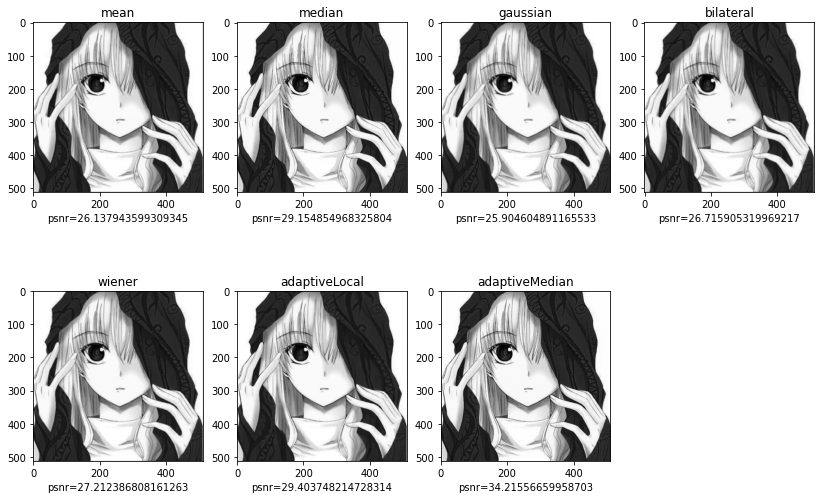

In [10]:
showImg(imgOr,x,y,3)

In [11]:
imgOr=plt.imread('test.png')
blur=cv2.blur(imgOr,(7,7))

imgOr = cv2.normalize(imgOr, None, alpha = 0, beta = 1, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
imgOr = imgOr.astype(np.float32)


The signal to noise ratio of image with s&p noise is 21.14491940254615
The signal to noise ratio of denoised image using mean filter is 25.169362726071643
The signal to noise ratio of denoised image using median filter is 30.156757299612643
The signal to noise ratio of denoised image using gaussian filter is 25.34793409980275
The signal to noise ratio of denoised image using bilateral filter is 26.12871016517149


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using wiener filter is 25.92678496185791
The signal to noise ratio of denoised image using adaptiveLocal filter is 24.42617235793342
The signal to noise ratio of denoised image using adaptiveMedian filter is 33.26990084520206


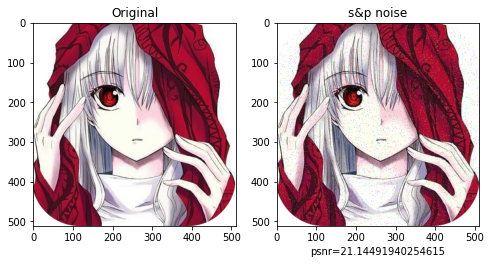

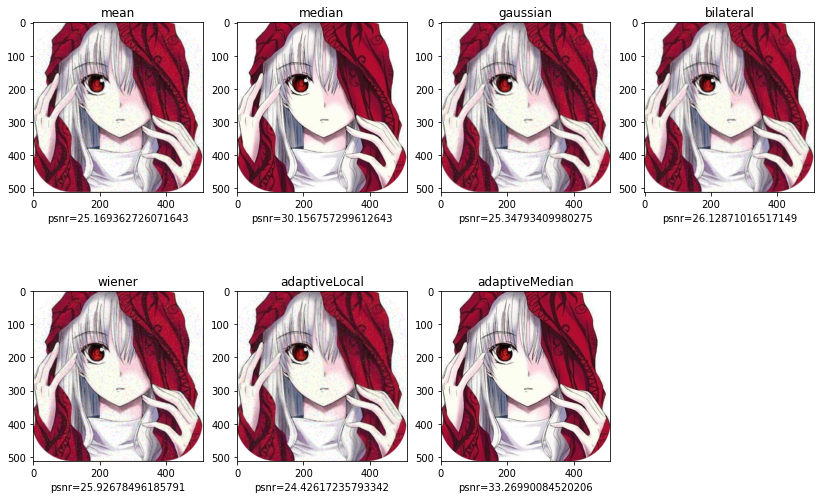

In [12]:
showImg(imgOr,x,y,0)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of image with gauss noise is 20.003671101921128


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using mean filter is 25.01327785957326


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using median filter is 25.344892102718127


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using gaussian filter is 25.305747942987825


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using bilateral filter is 25.995427245449196


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using wiener filter is 25.823579778715988


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using adaptiveLocal filter is 26.701216361685297


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using adaptiveMedian filter is 22.60790112462802


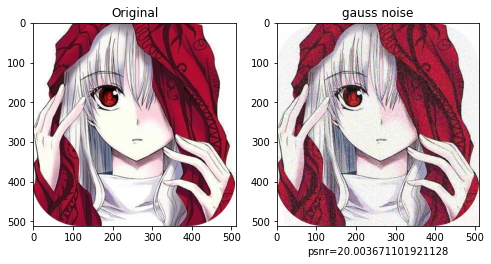

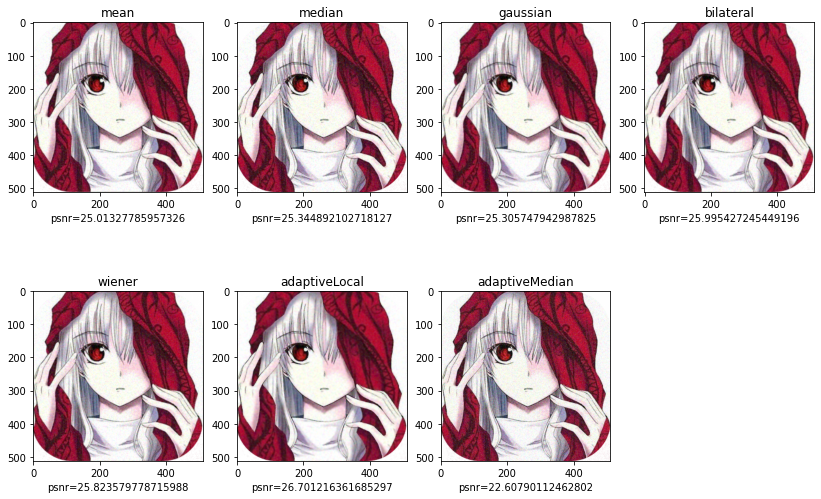

In [13]:
showImg(imgOr,x,y,1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of image with speckle noise is 22.08322162347054


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using mean filter is 25.64096131999832


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using median filter is 26.725877276260697


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using gaussian filter is 25.79587094496082


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using bilateral filter is 26.554291860248235


C:\Users\DELL\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\signal\signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
C:\Users\DELL\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\signal\signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using wiener filter is 26.57574900049542


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using adaptiveLocal filter is 27.85719032026421


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using adaptiveMedian filter is 24.610368000418955


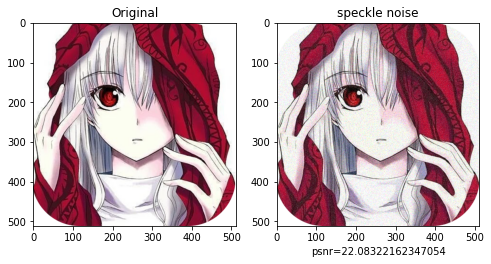

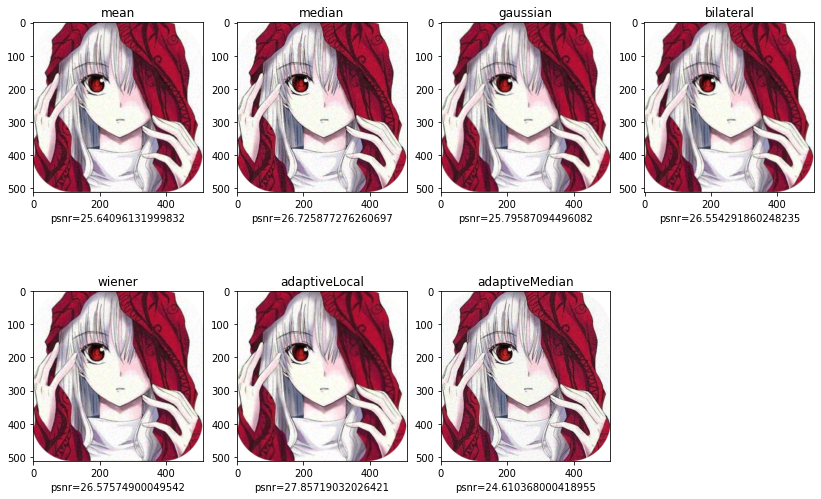

In [14]:
showImg(imgOr,x,y,2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of image with poisson noise is 25.62295550033326


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using mean filter is 26.301761847891775


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using median filter is 28.30349316048582


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using gaussian filter is 26.29789177334849


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using bilateral filter is 27.16013339350557


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using wiener filter is 27.423259489956457


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using adaptiveLocal filter is 29.08296667992515


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of denoised image using adaptiveMedian filter is 27.575454205140822


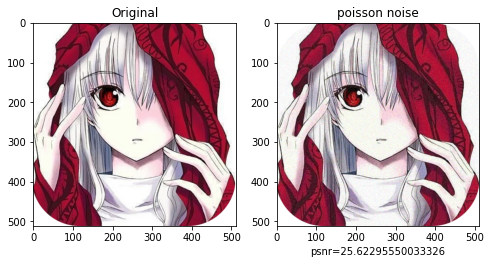

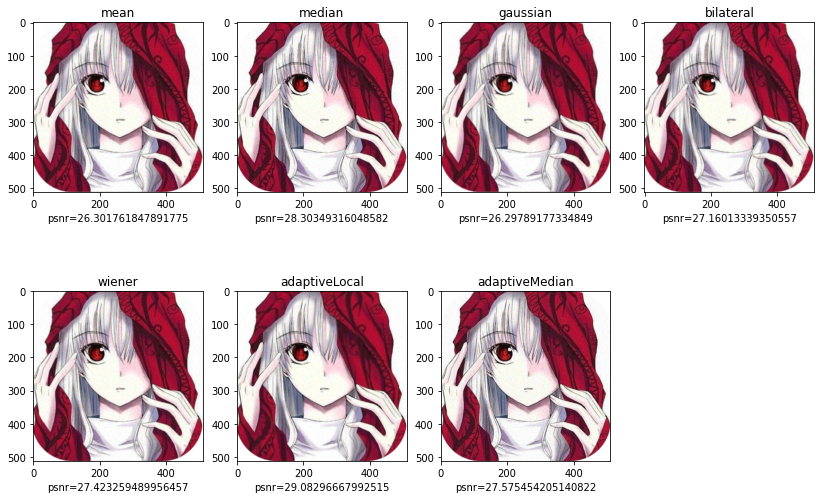

In [15]:
showImg(imgOr,x,y,3)

In [38]:
def denoise_Imgs(x,y,i,j):
	images=glob.glob('test_imgs/*')
	for im in images:
		imgOr=plt.imread(im)
		imgOr = cv2.normalize(imgOr, None, alpha = 0, beta = 1, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
		imgOr = imgOr.astype(np.float32)
		res=np.copy(imgOr)
		row,col,ch=imgOr.shape
		imgN=noisy(x[i],imgOr)
			
		txt="psnr="+str(psnr(imgN,imgOr))
		plt.figure(figsize=(12,12))
		plt.subplot(1,2,1)
		plt.imshow(imgN)
		plt.title('%s noise'%x[i])
		plt.xlabel(txt)
				
		for k in range(ch):	
			res[:,:,k]=filter(y[j],imgN[:,:,k])
		txt="psnr="+str(psnr(res,imgOr))
		plt.subplot(1,2,2)
		plt.imshow(res)
		plt.title('%s'%y[j])			
		plt.xlabel(txt)
		plt.show()
		print("The signal to noise ratio of image with",x[i],"noise is",psnr(imgN,imgOr))
		print("The signal to noise ratio of denoised image using",y[j],"filter is",psnr(res,imgOr))
	return

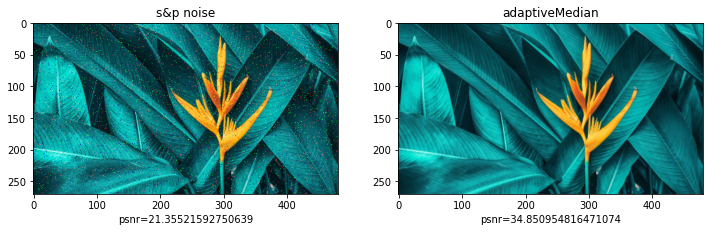

The signal to noise ratio of image with s&p noise is 21.35521592750639
The signal to noise ratio of denoised image using adaptiveMedian filter is 34.850954816471074


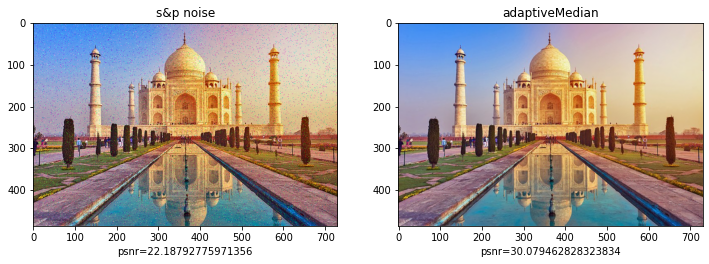

The signal to noise ratio of image with s&p noise is 22.18792775971356
The signal to noise ratio of denoised image using adaptiveMedian filter is 30.079462828323834


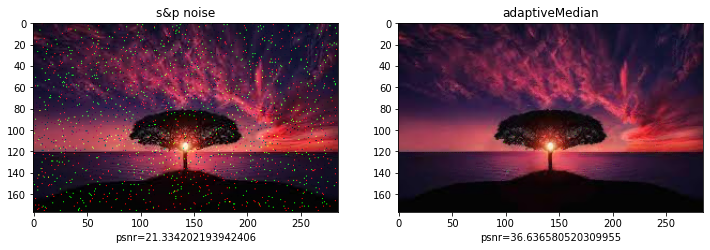

The signal to noise ratio of image with s&p noise is 21.334202193942406
The signal to noise ratio of denoised image using adaptiveMedian filter is 36.636580520309955


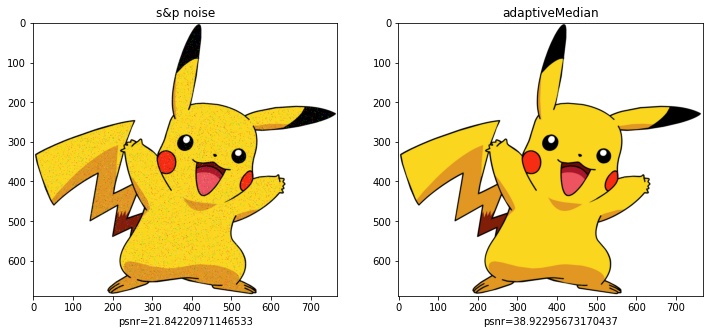

The signal to noise ratio of image with s&p noise is 21.84220971146533
The signal to noise ratio of denoised image using adaptiveMedian filter is 38.92295673170437


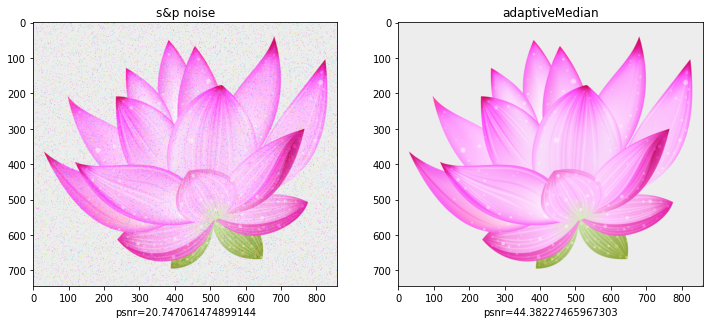

The signal to noise ratio of image with s&p noise is 20.747061474899144
The signal to noise ratio of denoised image using adaptiveMedian filter is 44.38227465967303


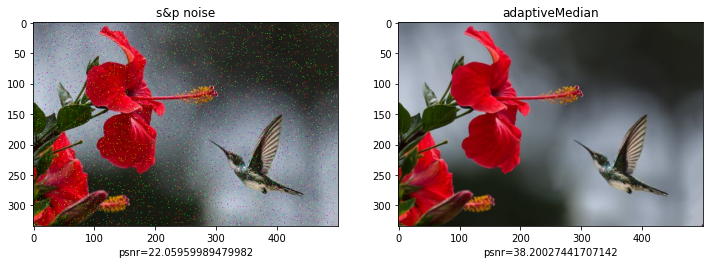

The signal to noise ratio of image with s&p noise is 22.05959989479982
The signal to noise ratio of denoised image using adaptiveMedian filter is 38.20027441707142


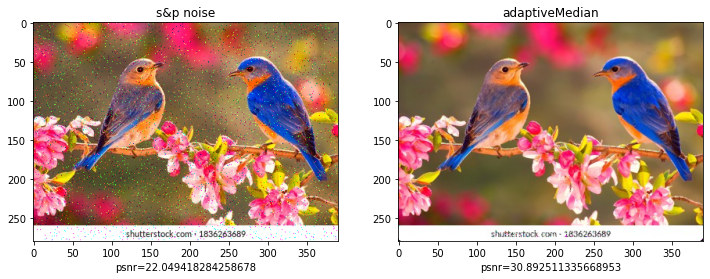

The signal to noise ratio of image with s&p noise is 22.049418284258678
The signal to noise ratio of denoised image using adaptiveMedian filter is 30.892511335668953


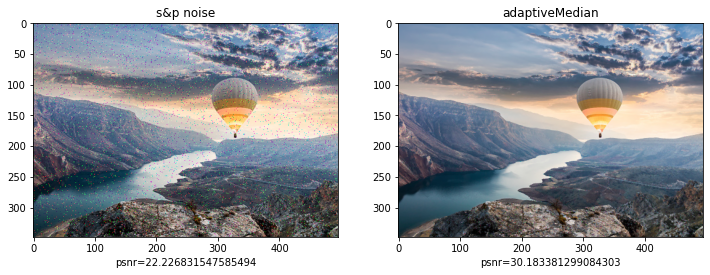

The signal to noise ratio of image with s&p noise is 22.226831547585494
The signal to noise ratio of denoised image using adaptiveMedian filter is 30.183381299084303


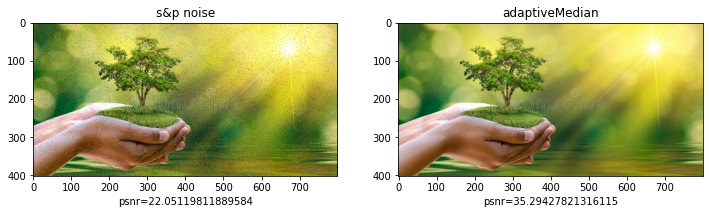

The signal to noise ratio of image with s&p noise is 22.05119811889584
The signal to noise ratio of denoised image using adaptiveMedian filter is 35.29427821316115


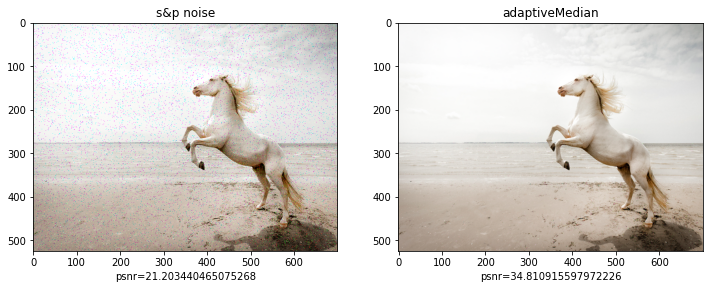

The signal to noise ratio of image with s&p noise is 21.203440465075268
The signal to noise ratio of denoised image using adaptiveMedian filter is 34.810915597972226


In [36]:
denoise_Imgs(x,y,0,6)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


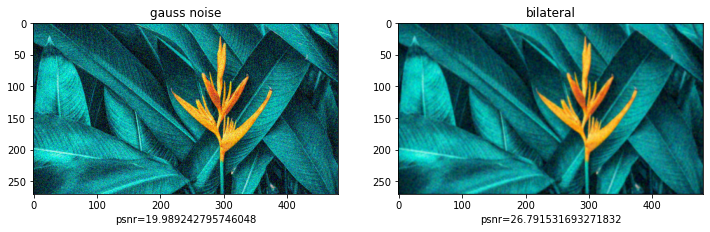

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of image with gauss noise is 19.989242795746048
The signal to noise ratio of denoised image using bilateral filter is 26.791531693271832


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


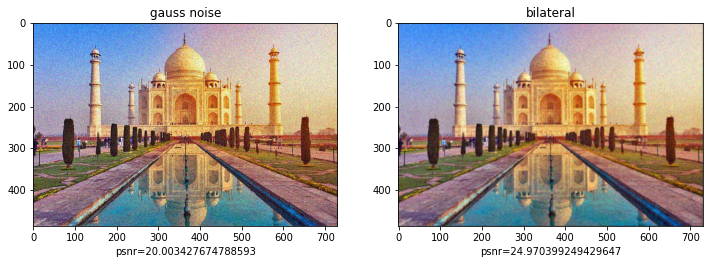

The signal to noise ratio of image with gauss noise is 20.003427674788593
The signal to noise ratio of denoised image using bilateral filter is 24.970399249429647


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


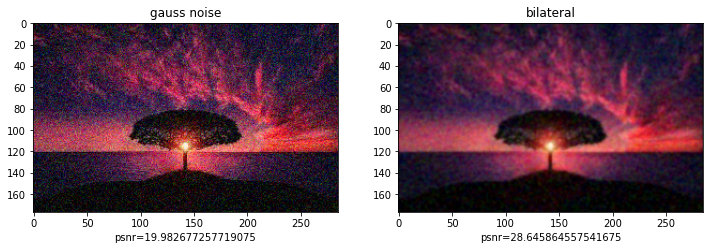

The signal to noise ratio of image with gauss noise is 19.982677257719075
The signal to noise ratio of denoised image using bilateral filter is 28.645864557541675


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


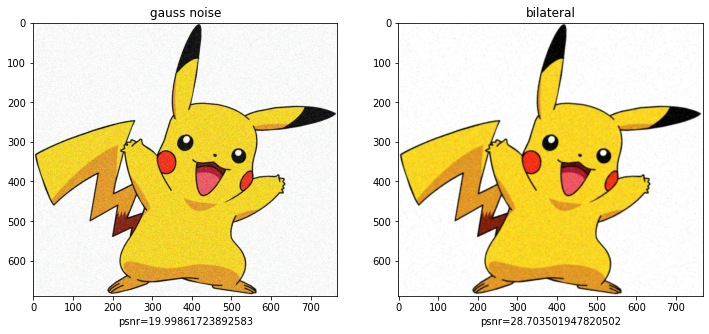

The signal to noise ratio of image with gauss noise is 19.99861723892583
The signal to noise ratio of denoised image using bilateral filter is 28.703501947820502


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


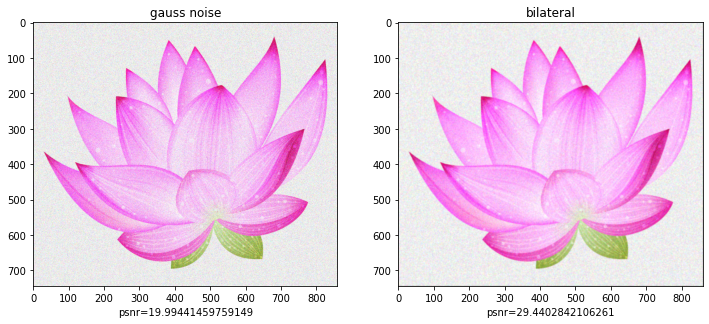

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of image with gauss noise is 19.99441459759149
The signal to noise ratio of denoised image using bilateral filter is 29.4402842106261


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


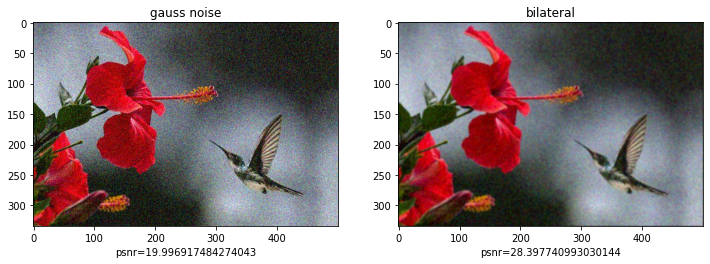

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of image with gauss noise is 19.996917484274043
The signal to noise ratio of denoised image using bilateral filter is 28.397740993030144


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


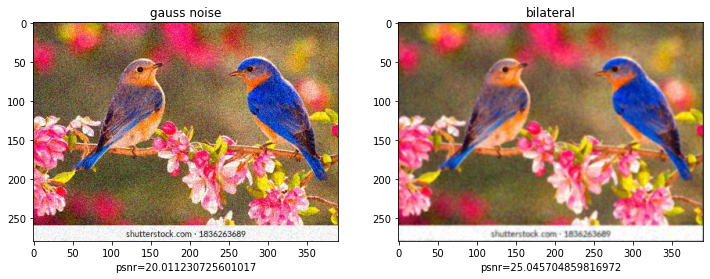

The signal to noise ratio of image with gauss noise is 20.011230725601017
The signal to noise ratio of denoised image using bilateral filter is 25.045704859816972


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


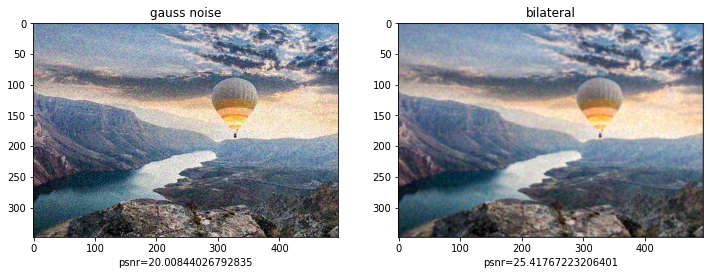

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of image with gauss noise is 20.00844026792835
The signal to noise ratio of denoised image using bilateral filter is 25.41767223206401


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


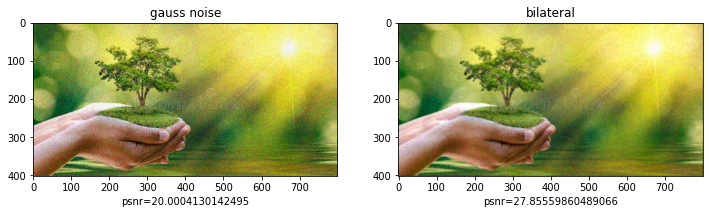

The signal to noise ratio of image with gauss noise is 20.0004130142495
The signal to noise ratio of denoised image using bilateral filter is 27.85559860489066


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


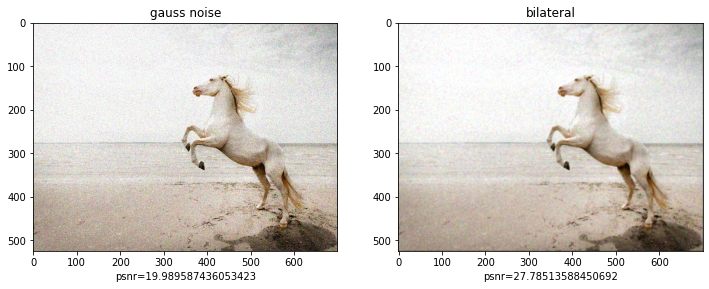

The signal to noise ratio of image with gauss noise is 19.989587436053423
The signal to noise ratio of denoised image using bilateral filter is 27.78513588450692


In [37]:
denoise_Imgs(x,y,1,3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


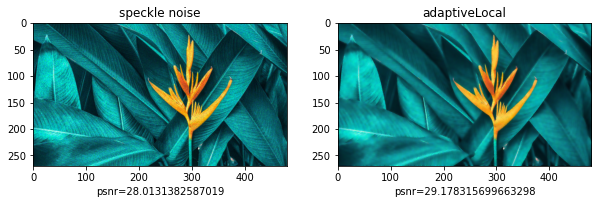

The signal to noise ratio of image with speckle noise is 28.0131382587019
The signal to noise ratio of denoised image using adaptiveLocal filter is 29.178315699663298


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


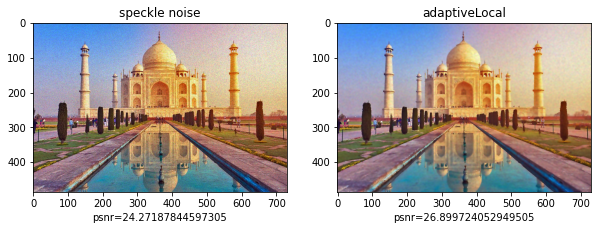

The signal to noise ratio of image with speckle noise is 24.27187844597305
The signal to noise ratio of denoised image using adaptiveLocal filter is 26.899724052949505


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


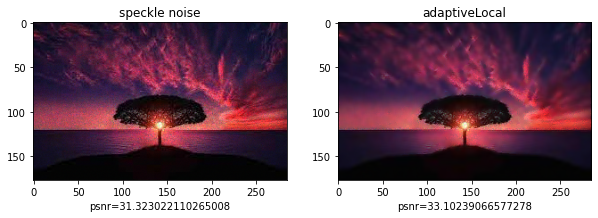

The signal to noise ratio of image with speckle noise is 31.323022110265008
The signal to noise ratio of denoised image using adaptiveLocal filter is 33.10239066577278


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


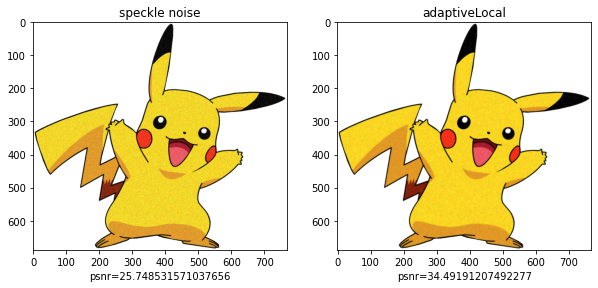

The signal to noise ratio of image with speckle noise is 25.748531571037656
The signal to noise ratio of denoised image using adaptiveLocal filter is 34.49191207492277


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


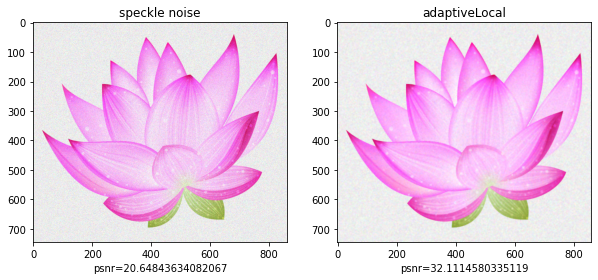

The signal to noise ratio of image with speckle noise is 20.64843634082067
The signal to noise ratio of denoised image using adaptiveLocal filter is 32.1114580335119


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


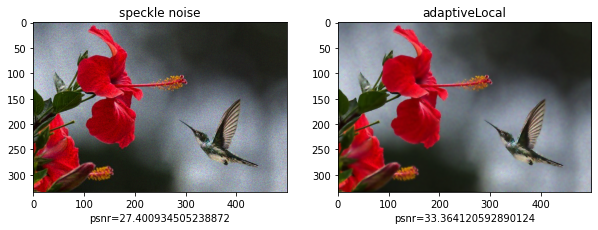

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of image with speckle noise is 27.400934505238872
The signal to noise ratio of denoised image using adaptiveLocal filter is 33.364120592890124


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


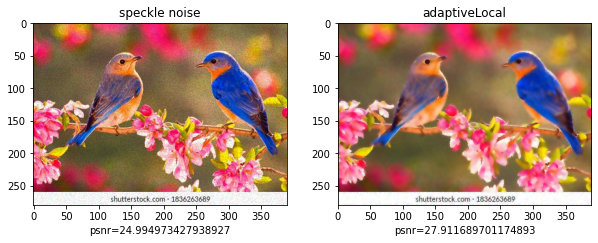

The signal to noise ratio of image with speckle noise is 24.994973427938927
The signal to noise ratio of denoised image using adaptiveLocal filter is 27.911689701174893


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


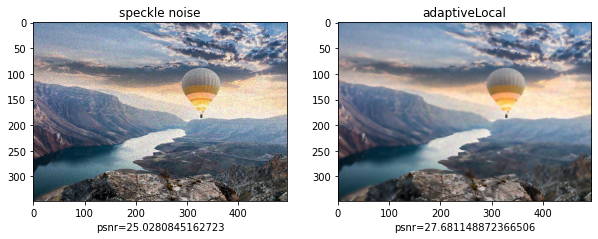

The signal to noise ratio of image with speckle noise is 25.0280845162723
The signal to noise ratio of denoised image using adaptiveLocal filter is 27.681148872366506


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


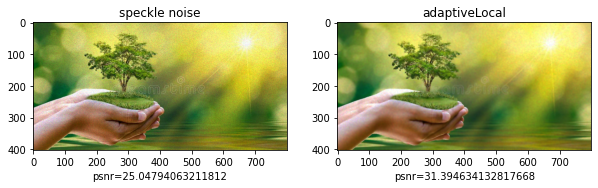

The signal to noise ratio of image with speckle noise is 25.04794063211812
The signal to noise ratio of denoised image using adaptiveLocal filter is 31.394634132817668


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


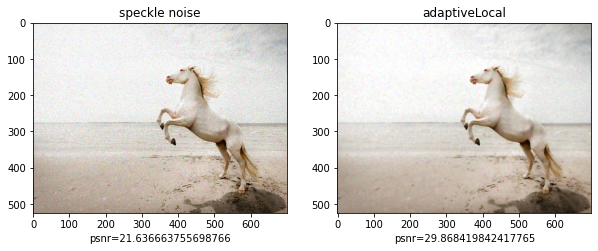

The signal to noise ratio of image with speckle noise is 21.636663755698766
The signal to noise ratio of denoised image using adaptiveLocal filter is 29.868419842417765


In [41]:
denoise_Imgs(x,y,2,5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


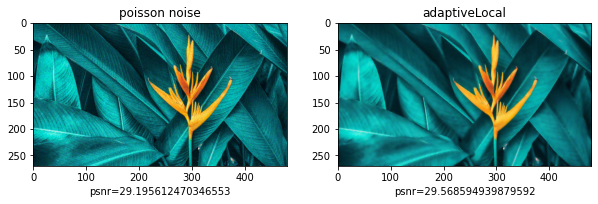

The signal to noise ratio of image with poisson noise is 29.195612470346553
The signal to noise ratio of denoised image using adaptiveLocal filter is 29.568594939879592


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


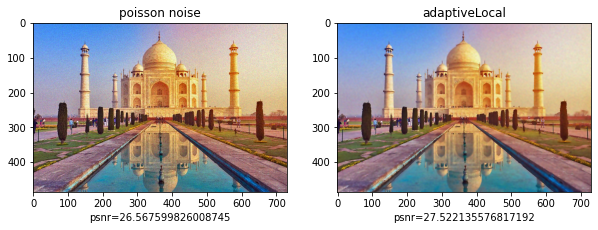

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of image with poisson noise is 26.567599826008745
The signal to noise ratio of denoised image using adaptiveLocal filter is 27.522135576817192


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


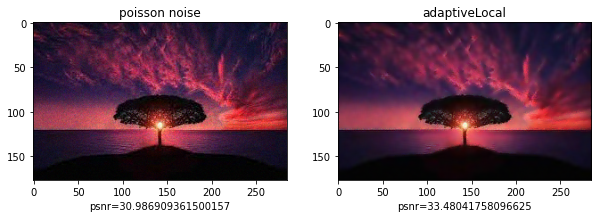

The signal to noise ratio of image with poisson noise is 30.986909361500157
The signal to noise ratio of denoised image using adaptiveLocal filter is 33.48041758096625


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


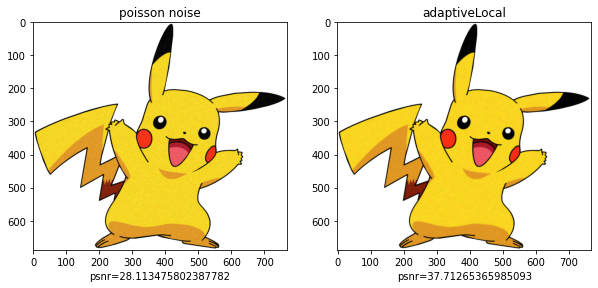

The signal to noise ratio of image with poisson noise is 28.113475802387782
The signal to noise ratio of denoised image using adaptiveLocal filter is 37.71265365985093


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


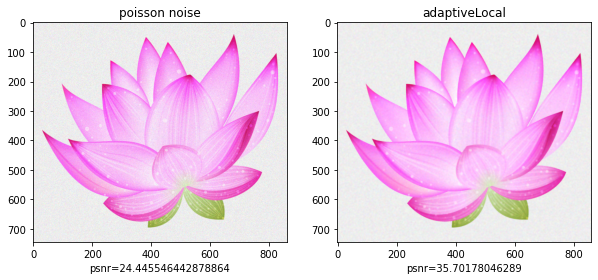

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


The signal to noise ratio of image with poisson noise is 24.445546442878864
The signal to noise ratio of denoised image using adaptiveLocal filter is 35.70178046289


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


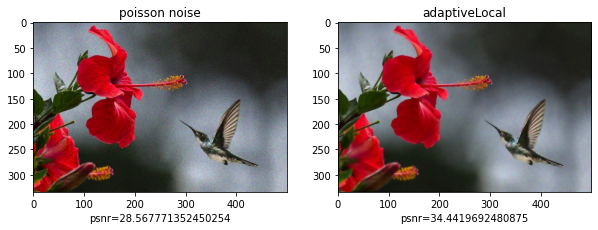

The signal to noise ratio of image with poisson noise is 28.567771352450254
The signal to noise ratio of denoised image using adaptiveLocal filter is 34.4419692480875


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


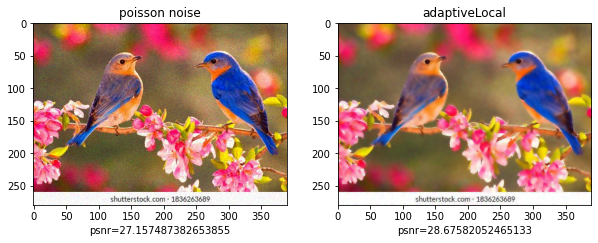

The signal to noise ratio of image with poisson noise is 27.157487382653855
The signal to noise ratio of denoised image using adaptiveLocal filter is 28.67582052465133


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


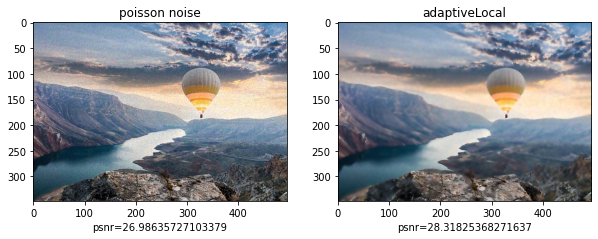

The signal to noise ratio of image with poisson noise is 26.98635727103379
The signal to noise ratio of denoised image using adaptiveLocal filter is 28.31825368271637


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


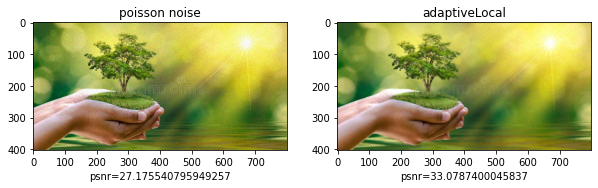

The signal to noise ratio of image with poisson noise is 27.175540795949257
The signal to noise ratio of denoised image using adaptiveLocal filter is 33.0787400045837


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


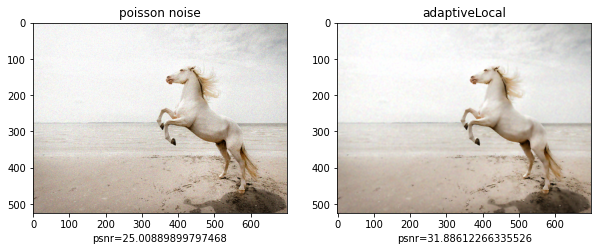

The signal to noise ratio of image with poisson noise is 25.00889899797468
The signal to noise ratio of denoised image using adaptiveLocal filter is 31.88612266335526


In [43]:
denoise_Imgs(x,y,3,5)